# TUTORIAL: Getting Started with Generative Adversarial Networks

Have you ever been amazed by what generative artificial intelligence could do, or wondered how they can generate realistic images?

In this tutorial, we will embark on an exciting journey into the world of GANs, which stands for Generating Adversarial Networks. No prior experience is necessary to follow along. We will walk you through every step, starting with the basic concepts (Discriminator, Generator) and gradually building up to the implementation of Deep Convolutional GANs (DCGANs). By the end of this tutorial, you will be able to generate your own images! 


### Introduction

*GANs have been introduced by Ian Goodfellow et al. in 2014 in the paper [Generative Adversarial Nets](https://arxiv.org/abs/1406.2661).*

GANs have become very popular last years, allowing us, for example, to: 

- Generate high-resolution images (avatars, objects and scenes)

- Augment our data (generating synthetic data samples for limited datasets)

- Enhance the resolution of low-resolution images (upscaling images)

- Transfer image style of one image to another (Black and white to color)

- Predict facial appearances at different ages (Face Aging)

#### What is a GAN and how it works?

A GAN is composed of two main components: a **generator $G$** and a **discriminator $D$**. 

Each component is a neural network, but their roles are different:

- The purpose of the generator $G$ is to **reproduce the data distribution of the training data $x$**, to **generate synthetic samples** for the same data distribution. These data are often images, but can also be audio or text. 

- On the other hand, the discriminator $D$ is a kind of judge who will **estimate whether a sample $x$ is real or fake** (has been generated). It is in fact a classifier that will say if a sample comes from the real data distribution or the generator.

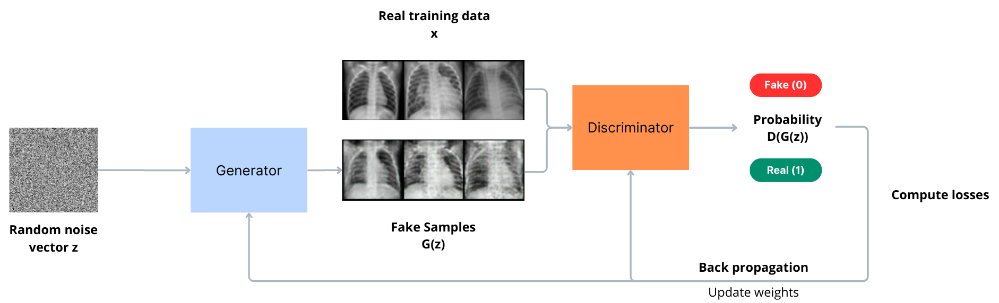

*<center>Illustration of GAN training</center>*

<br>

During training, the generator starts with a vector of random noise $z$ as input and produces synthetic samples. 

As training progresses, it refines its output, making the generated data more and more similar to the real data. The goal of the generator is to outsmart the discriminator into classifying its generated samples as real.

Meanwhile, the discriminator is presented with both real samples from the training data and fake samples from the generator. As it learns to discriminate between the two, it provides feedback to the generator about the quality of its generated samples. This is why the term *"**adversarial**"* is used here.

#### Mathematical approach

In fact, GANs come from game theory, where $D$ and $G$ are playing a two-player $minimax$ game with value function $V(G, D)$: 


<center>$\min_{G}\max_{D} V(D, G) = \mathbb{E}_{x\sim p_{\text{data}}(x)}[\log{D(x)}] +  \mathbb{E}_{z\sim p_{\text{z}}(z)}[1 - \log{D(G(z))}]$</center>


As we can observe, the **discriminator aims to maximize the V function**. To do this, it must maximize each of the two parts of the equation that will be added together. This means maximizing $\log{D(x)}$, so $D(x)$ in the first equation part (probability of real data), and minimizing the $D(G(z))$ in the second part (probability of fake data). 

Simultaneously, the **generator tries to minimize the function**. It only comes into play in the second part of the function, where it tries to obtain the highest value of $D(G(z))$ in order to fool the discriminator. 

In an ideal scenario, this iterative process would reach an equilibrium point, where the generator produces data that is indistinguishable from real data, and the discriminator's performance is 50% (random guessing).

GANs may not always reach this equilibrium due to the training process being sensitive to factors (architecture, hyperparameters, dataset complexity). The generator and discriminator may reach a dead end, oscillating between solutions or facing mode collapse, resulting in limited sample diversity. Also, it is important that discriminator does not start off too strong, otherwise the generator will not get any information on how to improve itself, since it does not know what the real data looks like.

#### DCGAN (Deep Convolutional GANs)

*DCGAN has been introduced in 2016 by Alec Radford et al. in the paper [Unsupervised Representation Learning with Deep Convolutional Generative Adversarial Networks](https://arxiv.org/abs/1511.06434).*

Its new architecture has considerably improved the quality and stability of image synthesis compared to classical GANs. Here are the major changes:

- Replace any pooling layers with strided convolutions (discriminator) and fractional-strided convolutions (generator), making them exceptionally well-suited for image generation tasks.
- Use batchnorm in both the generator and the discriminator.
- Removing fully connected hidden layers for deeper architectures.
- Use ReLU activation in generator for all layers except for the output, which uses tanh.
- Use LeakyReLU activation in the discriminator for all layer.


### Use case & Objective

In this tutorial, we will implement a DCGAN architecture and train it on a medical dataset to generate new images.

### Requirements

Using at least `1 GPU is highly recommended` when training a DCGAN (for memory & speed).

### Instructions
- Step 1 - Set up environment
- Step 2 - Download the Chest X-Ray Dataset
- Step 3 - Explore and prepare data for training
- Step 4 - Define the models
- Step 5 - Training
- Step 6 - Inference
- Step 7 - Post-processing

### Step 1 - Set up environment

As the first step, let's set up the structure of our project. Several libraries need to be installed.

In [ ]:
!pip install -r requirements.txt 

Now, we should be able to import the following librairies without any errors:

In [72]:
from IPython.display import HTML
import matplotlib.animation as animation
import matplotlib.pyplot as plt
import math
import numpy as np
import os
import random
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import zipfile

Now, let's set a seed to make our experiments reproducible:

In [74]:
seed = 42
random.seed(seed)
torch.manual_seed(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

### Step 2 - Download the Chest X-Ray Dataset

*You can either download the data in an [Object Storage](https://www.ovhcloud.com/en/public-cloud/object-storage/) that you link to your notebook, or put it in your notebook's default [workspace storage](https://help.ovhcloud.com/csm/en-gb-public-cloud-ai-notebooks-workspace?id=kb_article_view&sysparm_article=KB0058558).*

In this tutorial, we are going to focus on generating X-Ray images of chests, using the Chest X-Ray Images Dataset. It contains 5,863 X-Ray images (JPEG) and 2 classes (Pneumonia/Normal).

We can retrieve this dataset directly from [Kaggle](kaggle.com/), via their API. Go to [Kaggle](kaggle.com/) website, create an account if you do not have one, then click your profile picture and go to the `Account` category. Scroll down and click the `Create New API Token` button. You will get a `kaggle.json` file that will contain your credentials. Import it to the root of this notebook.

Then, we need to create a new hidden folder in our user's home directory with the name `.kaggle`:

In [ ]:
!mkdir ~/.kaggle

When this is done, we can move the downloaded file to this new folder:

In [35]:
mv ~/kaggle.json ~/.kaggle/kaggle.json

Now, we need to set the Kaggle API key to the `kaggle.json` file values:

In [36]:
!kaggle config set -n apikey -v ~/.kaggle/kaggle.json

- apikey is now set to: /workspace/.kaggle/kaggle.json


We can finally download the dataset:

In [37]:
!kaggle datasets download -d paultimothymooney/chest-xray-pneumonia

100%|█████████████████████████████████████▉| 2.29G/2.29G [01:02<00:00, 45.2MB/s]
100%|██████████████████████████████████████| 2.29G/2.29G [01:02<00:00, 39.4MB/s]


*If you get a `401 Unauthorized error`, create a new kaggle token and move your new `kaggle.json` file to the `/.kaggle` folder. or try to run `!chmod 600 /workspace/.kaggle/kaggle.json`.*

Downloading the dataset should give you a zip file called `chest-xray-pneumonia.zip`.

Now, you just have to unzip it with the following code:

In [38]:
# Unzip dataset
path_to_zip_file = "chest-xray-pneumonia.zip"
with zipfile.ZipFile(path_to_zip_file, 'r') as zip_ref:
    zip_ref.extractall("chest-xray-pneumonia")

### Step 3 - Explore and prepare data for training

We are going to load the dataset onto various workers, applying a transformation to each image that will:

- Resize images to `64x64xnumber_of_channels`, dimensions expected by our DCGAN. This resize will start from the center of each image, since we will be using center crop.

- Convert images to tensors (expected by PyTorch models).

- Normalize the image's pixel values, which improves training performance in AI.

*If original images are smaller than the desired size, transformation will pad the images to reach the specified size.* 

In [39]:
# Define parameters
dataroot = "chest-xray-pneumonia/chest_xray/train/"
nb_channels = 3 # For RGB images, but if you use grayscale images, ToTensor() will replicate the single channel into three channels, so you should not have to modify anything
image_resize = 64

batch_size = 128
nb_gpu = 1
nb_workers = 2 # based on system resources

# GPU or CPU (Not having at least 1 GPU can prevent code from working)
device = torch.device("cuda:0" if (torch.cuda.is_available() and nb_gpu > 0) else "cpu")

In [40]:
# Create the dataset by applying transformation to our images
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_resize),
                               transforms.CenterCrop(image_resize),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))       

In [56]:
print(f'Number of downloaded images: {len(dataset)}')

Number of downloaded images: 5216


We have a total of 5217 images in the dataset's train subset, which may not be sufficient for training a robust DCGAN. Additionally, it is important to consider that the dataset contains two classes—normal and pneumonia. While we will not separate the classes for data quantity purposes, improving your network's performance could be beneficial. Furthermore, it is advisable to verify if the classes are well-balanced.

#### Create a Data Loader
The next step is to create a data loader to efficiently load the data in mini-batches. Here, images will be batched by 128.

In [57]:
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=nb_workers)

real_batch = next(iter(dataloader))

#### Plot some training images of our dataset

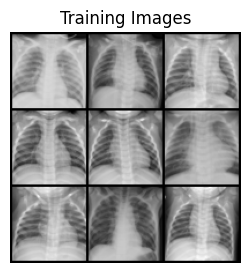

In [117]:
nb_images = 9
nb_row = math.ceil(math.sqrt(nb_images))

plt.figure(figsize=(3, 3))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0][:nb_images].to(device)[:nb_images], padding=2, normalize=True, nrow=nb_row).cpu(),(1,2,0)))

We have quite similar images in this dataset. The backgrounds are identical, and the chests are centered in the same way. Apart from the lack of data and the fact that we are handling 2 classes, the dataset seems ideal for training our DCGAN.

### Step 4 - Define the models

Now that we can iterate on our data, we can define our architectures.

#### Hyperparameters initialization

We will first define our hyperparameters. Many of them are based on indications given by in the [DCGAN paper]((https://arxiv.org/abs/1511.06434).*).

In [76]:
# Size of z latent vector (i.e. size of generator input), same size as described in the DCGAN paper
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 100

# Learning rate for optimizers, same value as described in the DCGAN paper
lr = 0.0002

# Beta1 hyperparameter for Adam optimizers, same value as described in the DCGAN paper
beta1 = 0.5

The following function will allow us to initialize the weights of our generator's & discriminator's convolutional layers with a normal distribution, and batch normalization layers with a mean of 1.0 and bias to 0.

In [77]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

We will use it on our networks when they will be initialized.   

#### Generator implementation

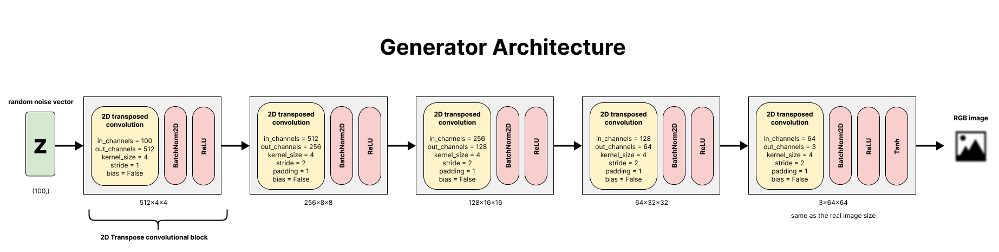

As shown in the image above, the generator takes a noise vector $z$ as input and generates 3x64x64 synthetic images (same size as the training images). 

To do this, it uses transposed convolutions (also known as deconvolutions) to progressively upsample the noise vector $z$ until it reaches the desired output image size. In fact, the transposed convolutions and the ReLU activation functions help the generator capture complex patterns and generate realistic images during the training process.

The final $Tanh()$ activation function ensures that the pixel values of the generated images are in the range $[-1, 1]$.

In [78]:
# Generator Code
class Generator(nn.Module):
    def __init__(self, nb_gpu):
        super(Generator, self).__init__()
        self.nb_gpu = nb_gpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            
            nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. ``(ngf*8) x 4 x 4``
            
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. ``(ngf*4) x 8 x 8``
            
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. ``(ngf*2) x 16 x 16``
            
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. ``(ngf) x 32 x 32``
            
            nn.ConvTranspose2d(ngf, nb_channels, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. ``(nb_channels) x 64 x 64``
        )

    def forward(self, input):
        return self.main(input)

Now, we can instantiate the generator by calling the previous class constructor, and apply the `weights_init()` function to its layers.

In [79]:
# Create the generator
netG = Generator(nb_gpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (nb_gpu > 1):
    netG = nn.DataParallel(netG, list(range(nb_gpu)))

# Apply the ``weights_init`` funb_channelstion to randomly initialize all weights
#  to ``mean=0``, ``stdev=0.02``.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


#### Discriminator implementation

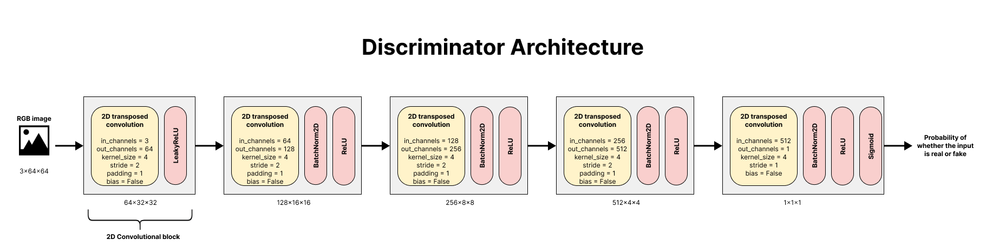

As shown in the image above, the discriminator takes an input image of size 3x64x64 and outputs a probability, indicating if the input image is real $(1)$ or fake $(0)$. To do this, it uses convolutional layers, batch normalization layers, and LeakyReLU functions, which are presented in the paper as architecture guidelines to follow. Probability is obtained thanks to the use of the sigmoid activation, which squashes the output to the range $[0, 1]$.

In [80]:
class Discriminator(nn.Module):
    def __init__(self, nb_gpu):
        super(Discriminator, self).__init__()
        self.nb_gpu = nb_gpu
        self.main = nn.Sequential(
            # input is ``(nb_channels) x 64 x 64``
            
            nn.Conv2d(nb_channels, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf) x 32 x 32``
            
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*2) x 16 x 16``
            
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*4) x 8 x 8``
            
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*8) x 4 x 4``
            
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [81]:
# Create the Discriminator
netD = Discriminator(nb_gpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (nb_gpu > 1):
    netD = nn.DataParallel(netD, list(range(nb_gpu)))

# Apply the ``weights_init`` function to randomly initialize all weights
# like this: ``to mean=0, stdev=0.2``.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


#### Define loss function and labels

Now that we have our adversarial networks, we need to define the loss function. The adversarial loss $V(D, G)$ can be approximated using the Binary Cross Entropy (BCE) loss function, which is commonly used for GANs because it measures the binary cross-entropy between the discriminator's output and the ground truth labels (real or fake) during training. It will calculate the loss for both the generator and the discriminator during backpropagation.

BCE Loss is computed with the following equation, where $target$ is the ground truth label $(1 or 0)$, and $output$ is the discriminator's output:

$BCELoss = -{(target * \log(output) + (1 - target) * \log(1 - output))}$

If we compare this equation to our previous $V(D, G)$ objective, we can see that BCE loss term for real data samples corresponds to the first term in $V(D, G)$, $(log(D(x)))$, and the BCE loss term for fake data samples corresponds to the second term in $V(D, G)$, $(log(1 - D(G(z))))$.

For example, in the context of the discriminator training, the BCE loss for real data samples $(D(x))$ is calculated by comparing the discriminator's output with a tensor of ones $(\text{real label} = 1.0)$, and the BCE loss for fake data samples $(D(G(z)))$ is calculated by comparing the discriminator's output with a tensor of zeros $(\text{fake label} = 0.0)$.

Let's take a look at the loss values for fake and real images:

In [82]:
# Real image and discriminator thinks it is real - Right decision
target = 1
output= 0.99 

print(-(target * math.log(output) + (1-target)*math.log(1-output)))

# Real image and discriminator thinks it is fake - False decision
target = 1
output= 0.01

print(-(target * math.log(output) + (1-target)*math.log(1-output)))

# False image but discriminator thinks it is real - False decision
target = 0
output= 0.99 

print(-(target * math.log(output) + (1-target)*math.log(1-output)))

0.01005033585350145
4.605170185988091
4.605170185988091


During training, **the goal is to minimize the BCE loss**. This way, the discriminator will learn to correctly classify real and generated samples, while the generator will learn to generate samples that can "fool" the discriminator into classifying them as real. 

We will be able to compute the BCE loss for the generator and also the discriminator separately, by using arguments as follows:

<code>
real_loss = criterion(output, real_label)
generated_loss = criterion(output, fake_label)
</code>

In [83]:
# Set real and fake label values (following GAN paper convention)
real_label = 1.
fake_label = 0.

# Define loss function
criterion = nn.BCELoss()

#### Define optimizers

We will use the Adam optimizer, according to the DCGAN paper.

In [84]:
# Setup optimizers for both G and D, according to the DCGAN paper
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

### Step 5 - Training 

#### Monitor learning progression

To monitor the generator's learning progress, we will create a constant batch of latent vectors drawn from a Gaussian distribution, denoted as `fixed_noise`. 

During the training loop, we will regularly feed this `fixed_noise` into the generator, and as the training progresses, we should follow how well the generator transforms these noise vectors into meaningful images.

In [85]:
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

We will also define the following flags. Change them as you wish: 

- `show_images` : Will display for each epoch the generated images from the `fixed_noise` vector
- `save_images` : Will save each displayed image in an `/images` folder
- `save_model` : Will save the generator and the discriminator every 5 epochs in a `/models` folder

In [86]:
# Flags - For each epoch
show_images = True
save_images = True
save_model = True

def save_dcgan(netG, netD, path_checkpoint):
    checkpoint = {"g_model_state_dict": netG.state_dict(),
                "d_model_state_dict": netD.state_dict(),
                }
    
    torch.save(checkpoint, path_checkpoint)
    
def makedir(new_dir):
  if not os.path.exists(new_dir):
    os.makedirs(new_dir)

# Create folders
makedir("images")
makedir("models")

#### Metrics

During training, we will compute the BCE Loss of the Discriminator and the Generator separately. For each batch, these losses will be calculated and added to the `D_losses` and `G_losses` lists, enabling us to plot the losses after training for each training iteration. Additionally, these losses will be printed during the epochs along with the following metrics:   
    
- `D_x`: Average output value of the discriminator in classifying real data samples in the current batch as real. During the initial training stages, `D_x` should quickly be close to 1. As the training progresses, this metric should decrease towards 0.5, especially if the GAN is learning effectively.

- `D_G_z1`: Average output value of the discriminator in classifying fake data samples in the current batch as fake. During the initial training stages, the generator is not yet good at generating realistic data, so `D_G_z1` should be close to 0. As the training progresses, this metric should move closer to 0.5, indicating that the generator can produce fake data samples that are more convincing to the discriminator.

- `D_G_z2`: Average output value of the discriminator in classifying fake data samples in the current batch as fake **after the generator's update step**. It is a metric we can use to better understand whether or not the generator is improving. Ideally, `D_G_z2` is expected to be greater than `D_G_z1`.

#### Launch training

We are now ready to train our DCGAN. As mentioned above, we will be using the same parameters as those mentioned in the DCGAN papers.

Do not hesitate to play with these parameters to try and vary your results! You can also check out the [GAN hacks repo](https://github.com/soumith/ganhacks), which shares many tips dedicated to training GANs.

Epoch: 0/100 Batches: 0/41	Loss_D: 1.5417   Loss_G: 5.1617    D(x): 0.6177    D(G(z)): 0.5483 / 0.0090


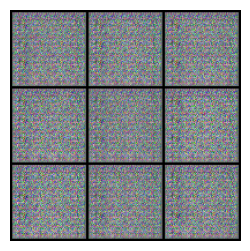

Epoch: 1/100 Batches: 0/41	Loss_D: 0.0035   Loss_G: 35.7233    D(x): 0.9969    D(G(z)): 0.0000 / 0.0000


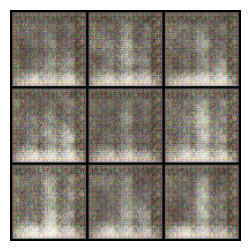

Epoch: 2/100 Batches: 0/41	Loss_D: 0.0398   Loss_G: 7.4416    D(x): 0.9692    D(G(z)): 0.0015 / 0.0035


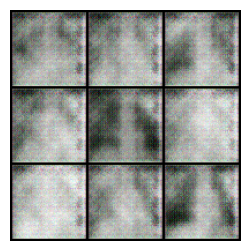

Epoch: 3/100 Batches: 0/41	Loss_D: 0.5293   Loss_G: 6.2780    D(x): 0.7078    D(G(z)): 0.0162 / 0.0043


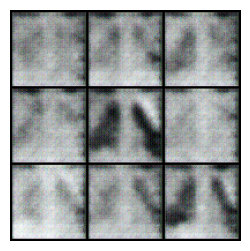

Epoch: 4/100 Batches: 0/41	Loss_D: 0.6001   Loss_G: 5.3463    D(x): 0.8516    D(G(z)): 0.2733 / 0.0103


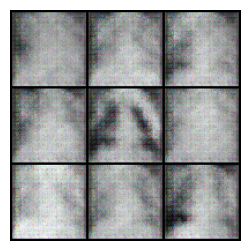

Epoch: 5/100 Batches: 0/41	Loss_D: 0.9520   Loss_G: 9.0416    D(x): 0.9045    D(G(z)): 0.4953 / 0.0004


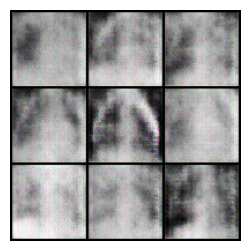

Epoch: 6/100 Batches: 0/41	Loss_D: 0.7709   Loss_G: 3.6211    D(x): 0.7233    D(G(z)): 0.2600 / 0.0386


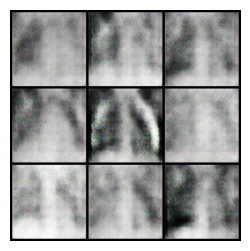

Epoch: 7/100 Batches: 0/41	Loss_D: 0.5583   Loss_G: 3.9701    D(x): 0.8330    D(G(z)): 0.2670 / 0.0364


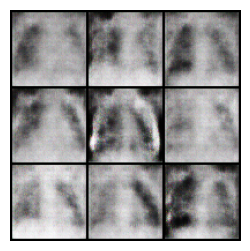

Epoch: 8/100 Batches: 0/41	Loss_D: 0.7114   Loss_G: 2.4476    D(x): 0.7289    D(G(z)): 0.2380 / 0.1177


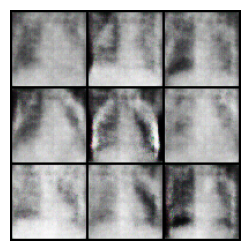

Epoch: 9/100 Batches: 0/41	Loss_D: 0.6366   Loss_G: 4.1896    D(x): 0.8735    D(G(z)): 0.3510 / 0.0298


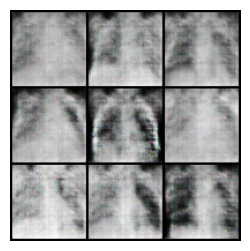

Epoch: 10/100 Batches: 0/41	Loss_D: 0.7888   Loss_G: 3.1637    D(x): 0.8213    D(G(z)): 0.3075 / 0.0873


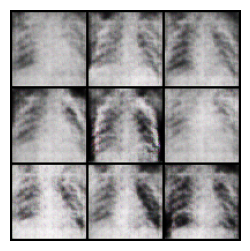

Epoch: 11/100 Batches: 0/41	Loss_D: 0.3534   Loss_G: 4.3776    D(x): 0.7842    D(G(z)): 0.0595 / 0.0257


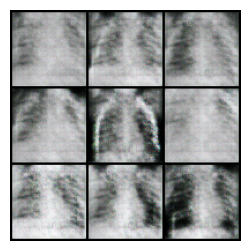

Epoch: 12/100 Batches: 0/41	Loss_D: 0.6340   Loss_G: 4.9281    D(x): 0.8404    D(G(z)): 0.3246 / 0.0204


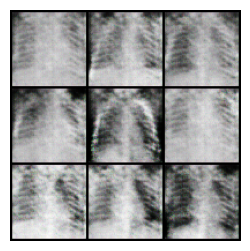

Epoch: 13/100 Batches: 0/41	Loss_D: 1.2064   Loss_G: 10.9843    D(x): 0.9239    D(G(z)): 0.6209 / 0.0007


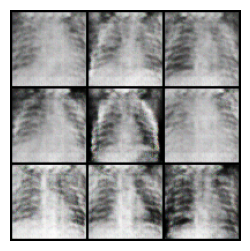

Epoch: 14/100 Batches: 0/41	Loss_D: 0.6732   Loss_G: 2.1042    D(x): 0.6240    D(G(z)): 0.0613 / 0.1644


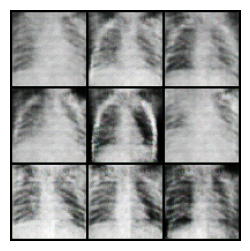

Epoch: 15/100 Batches: 0/41	Loss_D: 0.7368   Loss_G: 6.5714    D(x): 0.9101    D(G(z)): 0.4179 / 0.0082


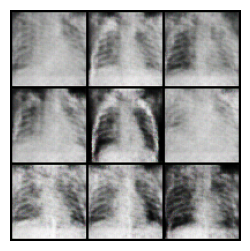

Epoch: 16/100 Batches: 0/41	Loss_D: 0.5088   Loss_G: 2.7417    D(x): 0.7245    D(G(z)): 0.1006 / 0.1100


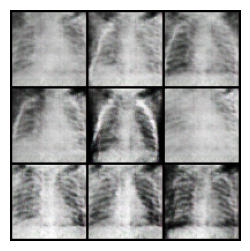

Epoch: 17/100 Batches: 0/41	Loss_D: 0.2441   Loss_G: 4.7776    D(x): 0.8896    D(G(z)): 0.1037 / 0.0156


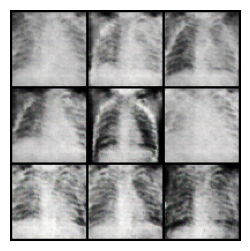

Epoch: 18/100 Batches: 0/41	Loss_D: 0.5307   Loss_G: 3.8128    D(x): 0.7866    D(G(z)): 0.1774 / 0.0546


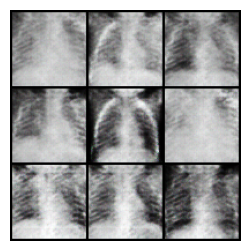

Epoch: 19/100 Batches: 0/41	Loss_D: 0.6475   Loss_G: 6.4757    D(x): 0.9440    D(G(z)): 0.4114 / 0.0049


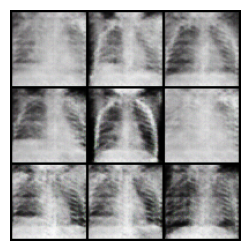

Epoch: 20/100 Batches: 0/41	Loss_D: 0.4613   Loss_G: 5.3996    D(x): 0.8968    D(G(z)): 0.2646 / 0.0159


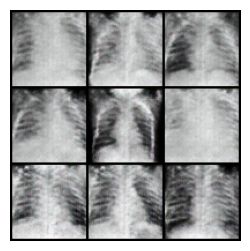

Epoch: 21/100 Batches: 0/41	Loss_D: 0.5861   Loss_G: 6.2258    D(x): 0.8936    D(G(z)): 0.3309 / 0.0065


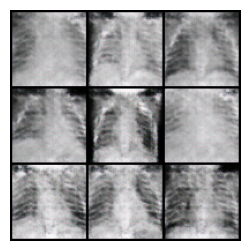

Epoch: 22/100 Batches: 0/41	Loss_D: 0.5713   Loss_G: 6.0422    D(x): 0.9193    D(G(z)): 0.3443 / 0.0141


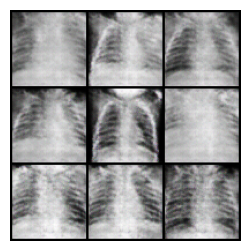

Epoch: 23/100 Batches: 0/41	Loss_D: 0.5841   Loss_G: 6.8429    D(x): 0.9017    D(G(z)): 0.3129 / 0.0054


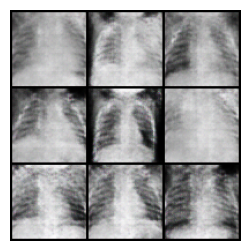

Epoch: 24/100 Batches: 0/41	Loss_D: 0.3834   Loss_G: 5.1759    D(x): 0.8095    D(G(z)): 0.0954 / 0.0144


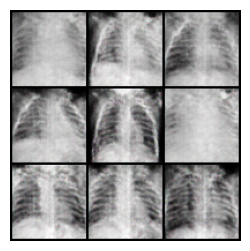

Epoch: 25/100 Batches: 0/41	Loss_D: 0.6436   Loss_G: 5.9363    D(x): 0.9299    D(G(z)): 0.3751 / 0.0052


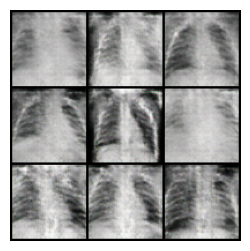

Epoch: 26/100 Batches: 0/41	Loss_D: 0.8540   Loss_G: 6.9482    D(x): 0.9222    D(G(z)): 0.4398 / 0.0028


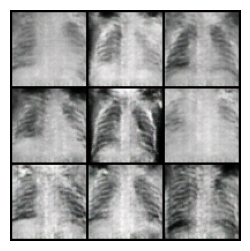

Epoch: 27/100 Batches: 0/41	Loss_D: 2.2248   Loss_G: 2.5852    D(x): 0.2111    D(G(z)): 0.0142 / 0.1675


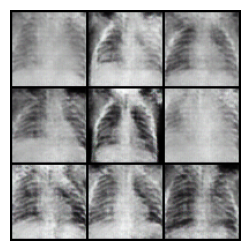

Epoch: 28/100 Batches: 0/41	Loss_D: 0.3499   Loss_G: 4.9978    D(x): 0.8577    D(G(z)): 0.1416 / 0.0190


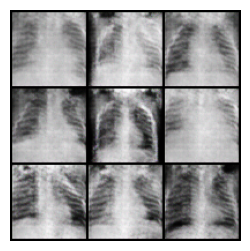

Epoch: 29/100 Batches: 0/41	Loss_D: 0.5783   Loss_G: 6.2674    D(x): 0.9533    D(G(z)): 0.3702 / 0.0046


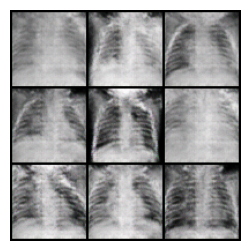

Epoch: 30/100 Batches: 0/41	Loss_D: 1.2739   Loss_G: 3.5393    D(x): 0.3938    D(G(z)): 0.0053 / 0.0637


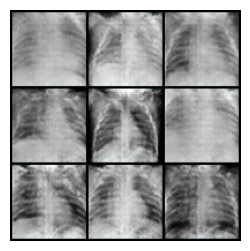

Epoch: 31/100 Batches: 0/41	Loss_D: 0.3887   Loss_G: 5.4516    D(x): 0.8698    D(G(z)): 0.1946 / 0.0122


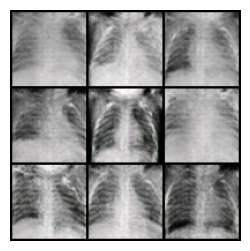

Epoch: 32/100 Batches: 0/41	Loss_D: 0.8293   Loss_G: 4.1167    D(x): 0.5614    D(G(z)): 0.0042 / 0.0591


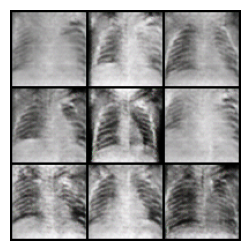

Epoch: 33/100 Batches: 0/41	Loss_D: 0.3153   Loss_G: 3.8712    D(x): 0.8586    D(G(z)): 0.1142 / 0.0341


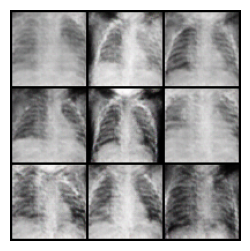

Epoch: 34/100 Batches: 0/41	Loss_D: 0.4540   Loss_G: 3.3629    D(x): 0.7069    D(G(z)): 0.0447 / 0.0625


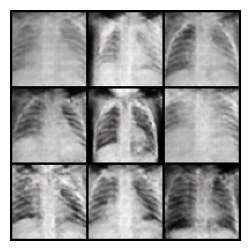

Epoch: 35/100 Batches: 0/41	Loss_D: 0.4148   Loss_G: 5.1175    D(x): 0.8630    D(G(z)): 0.2025 / 0.0204


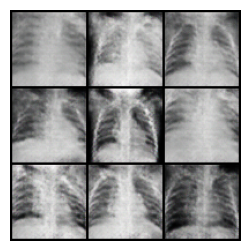

Epoch: 36/100 Batches: 0/41	Loss_D: 0.7132   Loss_G: 7.0155    D(x): 0.9433    D(G(z)): 0.4093 / 0.0040


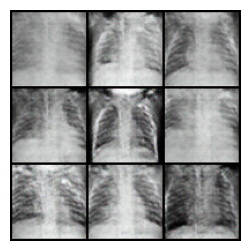

Epoch: 37/100 Batches: 0/41	Loss_D: 0.4019   Loss_G: 4.4865    D(x): 0.8355    D(G(z)): 0.1488 / 0.0247


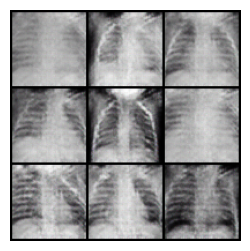

Epoch: 38/100 Batches: 0/41	Loss_D: 0.5301   Loss_G: 2.8292    D(x): 0.6784    D(G(z)): 0.0301 / 0.1198


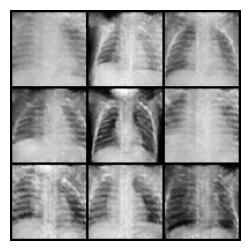

Epoch: 39/100 Batches: 0/41	Loss_D: 0.4708   Loss_G: 5.7557    D(x): 0.8802    D(G(z)): 0.2653 / 0.0083


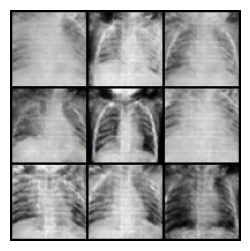

Epoch: 40/100 Batches: 0/41	Loss_D: 0.3837   Loss_G: 5.5073    D(x): 0.9090    D(G(z)): 0.2117 / 0.0123


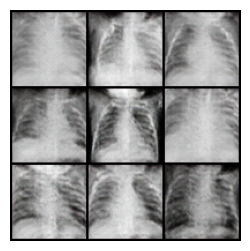

Epoch: 41/100 Batches: 0/41	Loss_D: 0.5201   Loss_G: 2.7469    D(x): 0.7038    D(G(z)): 0.0495 / 0.1251


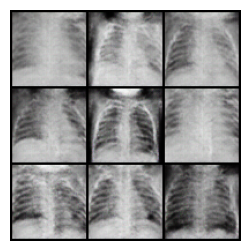

Epoch: 42/100 Batches: 0/41	Loss_D: 0.5402   Loss_G: 3.0283    D(x): 0.6726    D(G(z)): 0.0274 / 0.0771


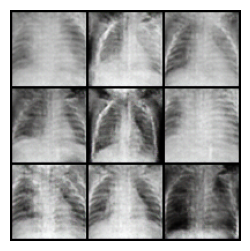

Epoch: 43/100 Batches: 0/41	Loss_D: 0.4022   Loss_G: 6.3992    D(x): 0.9234    D(G(z)): 0.2432 / 0.0062


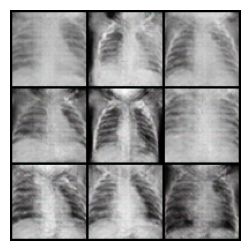

Epoch: 44/100 Batches: 0/41	Loss_D: 0.3145   Loss_G: 3.5979    D(x): 0.7937    D(G(z)): 0.0513 / 0.0364


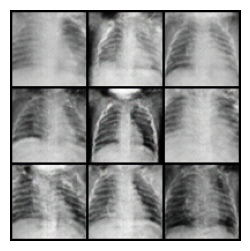

Epoch: 45/100 Batches: 0/41	Loss_D: 0.2653   Loss_G: 4.6707    D(x): 0.8941    D(G(z)): 0.1197 / 0.0178


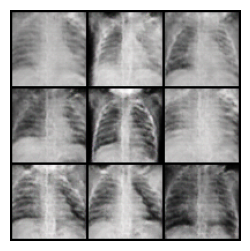

Epoch: 46/100 Batches: 0/41	Loss_D: 1.4955   Loss_G: 2.8911    D(x): 0.3507    D(G(z)): 0.0057 / 0.1219


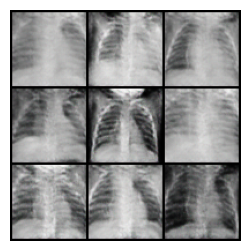

Epoch: 47/100 Batches: 0/41	Loss_D: 0.5393   Loss_G: 8.2240    D(x): 0.9564    D(G(z)): 0.3542 / 0.0018


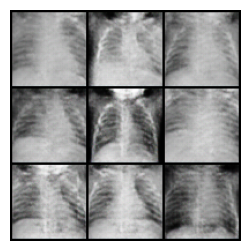

Epoch: 48/100 Batches: 0/41	Loss_D: 0.3570   Loss_G: 5.2793    D(x): 0.8969    D(G(z)): 0.1842 / 0.0098


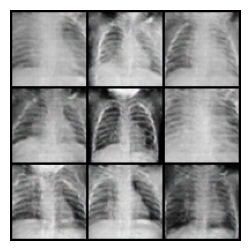

Epoch: 49/100 Batches: 0/41	Loss_D: 0.2627   Loss_G: 3.6065    D(x): 0.8293    D(G(z)): 0.0492 / 0.0420


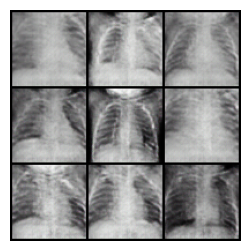

Epoch: 50/100 Batches: 0/41	Loss_D: 0.5773   Loss_G: 2.9768    D(x): 0.6793    D(G(z)): 0.0485 / 0.0835


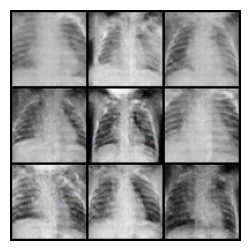

Epoch: 51/100 Batches: 0/41	Loss_D: 0.3602   Loss_G: 4.5854    D(x): 0.8665    D(G(z)): 0.1588 / 0.0188


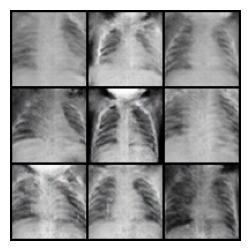

Epoch: 52/100 Batches: 0/41	Loss_D: 0.2571   Loss_G: 3.5731    D(x): 0.8624    D(G(z)): 0.0634 / 0.0427


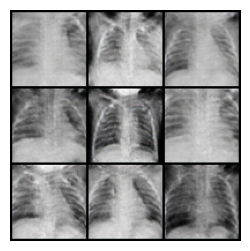

Epoch: 53/100 Batches: 0/41	Loss_D: 0.2947   Loss_G: 4.6394    D(x): 0.9096    D(G(z)): 0.1616 / 0.0259


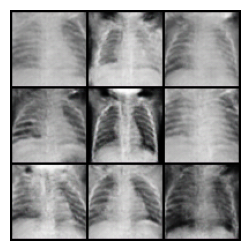

Epoch: 54/100 Batches: 0/41	Loss_D: 0.2797   Loss_G: 4.1569    D(x): 0.8716    D(G(z)): 0.0934 / 0.0263


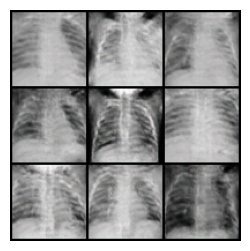

Epoch: 55/100 Batches: 0/41	Loss_D: 0.5032   Loss_G: 6.4848    D(x): 0.9672    D(G(z)): 0.3108 / 0.0040


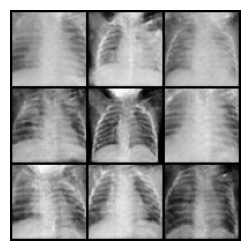

Epoch: 56/100 Batches: 0/41	Loss_D: 0.1434   Loss_G: 5.0306    D(x): 0.9123    D(G(z)): 0.0386 / 0.0151


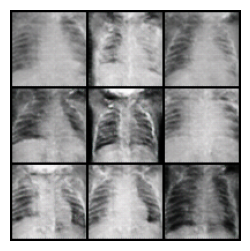

Epoch: 57/100 Batches: 0/41	Loss_D: 0.2495   Loss_G: 3.9389    D(x): 0.8566    D(G(z)): 0.0484 / 0.0320


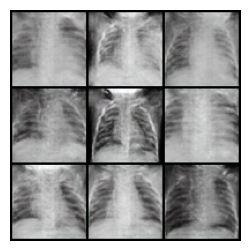

Epoch: 58/100 Batches: 0/41	Loss_D: 0.2309   Loss_G: 5.0024    D(x): 0.9375    D(G(z)): 0.1373 / 0.0115


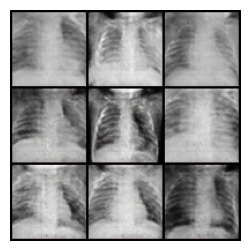

Epoch: 59/100 Batches: 0/41	Loss_D: 0.2232   Loss_G: 5.0507    D(x): 0.9558    D(G(z)): 0.1408 / 0.0116


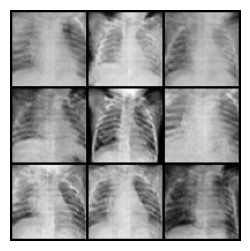

Epoch: 60/100 Batches: 0/41	Loss_D: 0.3281   Loss_G: 5.0819    D(x): 0.8633    D(G(z)): 0.1109 / 0.0148


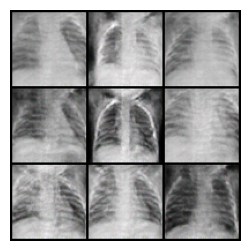

Epoch: 61/100 Batches: 0/41	Loss_D: 0.3102   Loss_G: 5.3481    D(x): 0.9034    D(G(z)): 0.1680 / 0.0088


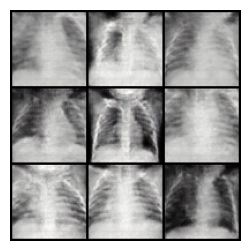

Epoch: 62/100 Batches: 0/41	Loss_D: 0.4026   Loss_G: 7.2906    D(x): 0.9358    D(G(z)): 0.2356 / 0.0031


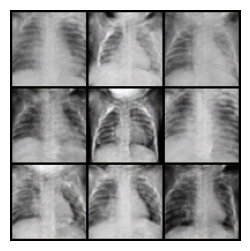

Epoch: 63/100 Batches: 0/41	Loss_D: 0.2605   Loss_G: 4.2874    D(x): 0.8821    D(G(z)): 0.1010 / 0.0217


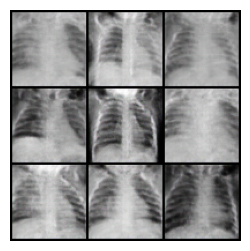

Epoch: 64/100 Batches: 0/41	Loss_D: 0.2833   Loss_G: 6.2290    D(x): 0.9572    D(G(z)): 0.1921 / 0.0058


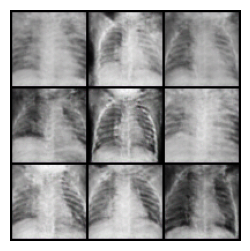

Epoch: 65/100 Batches: 0/41	Loss_D: 0.4379   Loss_G: 6.9203    D(x): 0.9620    D(G(z)): 0.2760 / 0.0026


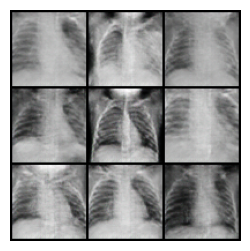

Epoch: 66/100 Batches: 0/41	Loss_D: 0.2462   Loss_G: 5.8411    D(x): 0.9517    D(G(z)): 0.1665 / 0.0056


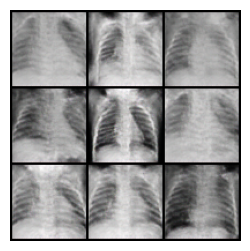

Epoch: 70/100 Batches: 0/41	Loss_D: 0.2398   Loss_G: 6.1222    D(x): 0.9631    D(G(z)): 0.1706 / 0.0039


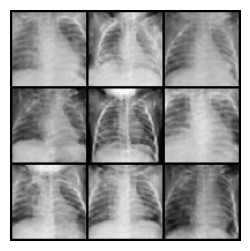

Epoch: 71/100 Batches: 0/41	Loss_D: 0.4393   Loss_G: 7.6867    D(x): 0.9777    D(G(z)): 0.2840 / 0.0009


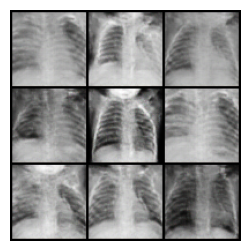

Epoch: 72/100 Batches: 0/41	Loss_D: 0.2396   Loss_G: 4.2938    D(x): 0.8630    D(G(z)): 0.0467 / 0.0285


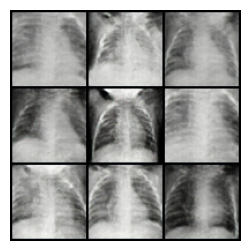

Epoch: 73/100 Batches: 0/41	Loss_D: 3.5977   Loss_G: 0.7472    D(x): 0.1404    D(G(z)): 0.0014 / 0.5897


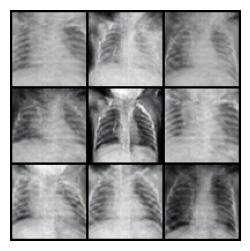

Epoch: 74/100 Batches: 0/41	Loss_D: 0.2812   Loss_G: 4.1136    D(x): 0.8814    D(G(z)): 0.1148 / 0.0320


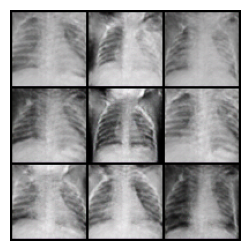

Epoch: 75/100 Batches: 0/41	Loss_D: 0.1540   Loss_G: 6.7442    D(x): 0.8936    D(G(z)): 0.0186 / 0.0052


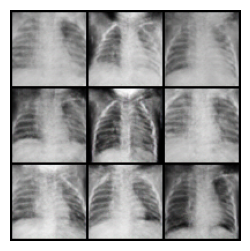

Epoch: 76/100 Batches: 0/41	Loss_D: 0.2786   Loss_G: 4.3501    D(x): 0.8083    D(G(z)): 0.0165 / 0.0257


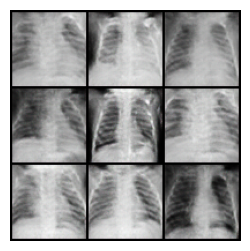

Epoch: 77/100 Batches: 0/41	Loss_D: 0.2676   Loss_G: 4.7503    D(x): 0.8301    D(G(z)): 0.0281 / 0.0451


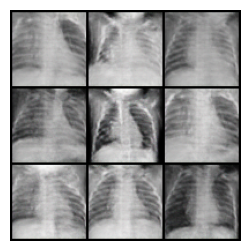

Epoch: 78/100 Batches: 0/41	Loss_D: 0.4066   Loss_G: 4.4094    D(x): 0.8654    D(G(z)): 0.1709 / 0.0195


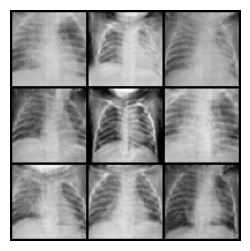

Epoch: 79/100 Batches: 0/41	Loss_D: 0.1858   Loss_G: 5.4529    D(x): 0.9582    D(G(z)): 0.1242 / 0.0085


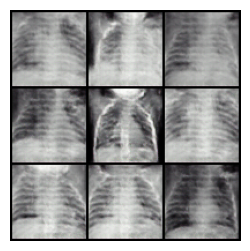

Epoch: 80/100 Batches: 0/41	Loss_D: 0.2768   Loss_G: 5.0989    D(x): 0.8199    D(G(z)): 0.0383 / 0.0338


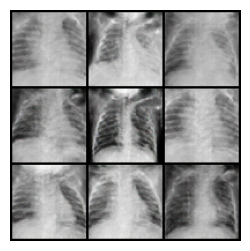

Epoch: 81/100 Batches: 0/41	Loss_D: 0.1553   Loss_G: 3.9389    D(x): 0.9269    D(G(z)): 0.0602 / 0.0379


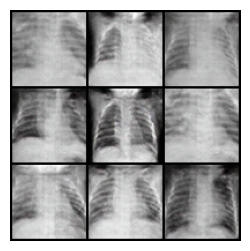

Epoch: 82/100 Batches: 0/41	Loss_D: 0.1676   Loss_G: 4.6857    D(x): 0.9224    D(G(z)): 0.0653 / 0.0156


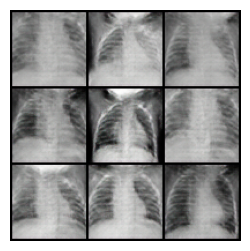

Epoch: 83/100 Batches: 0/41	Loss_D: 0.2286   Loss_G: 4.1056    D(x): 0.8502    D(G(z)): 0.0181 / 0.0262


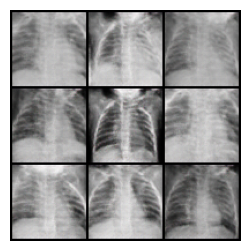

Epoch: 84/100 Batches: 0/41	Loss_D: 0.1114   Loss_G: 5.4635    D(x): 0.9458    D(G(z)): 0.0489 / 0.0091


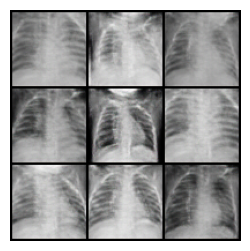

Epoch: 85/100 Batches: 0/41	Loss_D: 0.3183   Loss_G: 3.0621    D(x): 0.8203    D(G(z)): 0.0414 / 0.0730


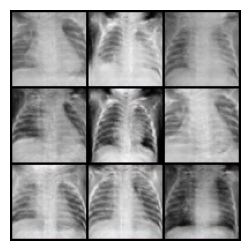

Epoch: 86/100 Batches: 0/41	Loss_D: 0.2303   Loss_G: 5.2960    D(x): 0.8283    D(G(z)): 0.0061 / 0.0105


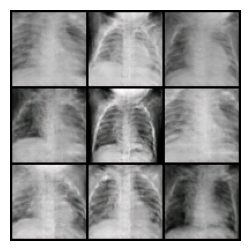

Epoch: 87/100 Batches: 0/41	Loss_D: 0.5149   Loss_G: 9.6553    D(x): 0.9970    D(G(z)): 0.2954 / 0.0006


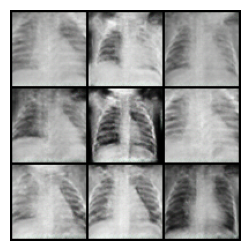

Epoch: 88/100 Batches: 0/41	Loss_D: 0.5707   Loss_G: 3.4205    D(x): 0.6620    D(G(z)): 0.0172 / 0.0950


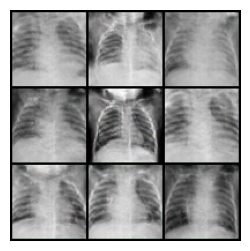

Epoch: 89/100 Batches: 0/41	Loss_D: 0.1696   Loss_G: 3.5258    D(x): 0.9041    D(G(z)): 0.0411 / 0.0457


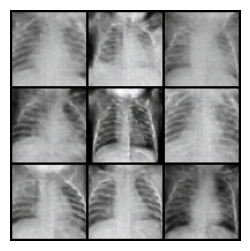

Epoch: 90/100 Batches: 0/41	Loss_D: 0.1432   Loss_G: 5.7076    D(x): 0.9002    D(G(z)): 0.0183 / 0.0067


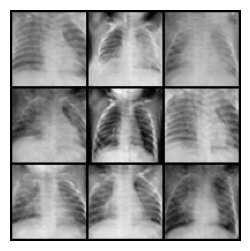

Epoch: 91/100 Batches: 0/41	Loss_D: 0.2519   Loss_G: 6.2713    D(x): 0.9483    D(G(z)): 0.1403 / 0.0064


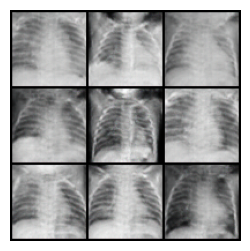

Epoch: 92/100 Batches: 0/41	Loss_D: 0.1164   Loss_G: 4.8769    D(x): 0.9559    D(G(z)): 0.0614 / 0.0142


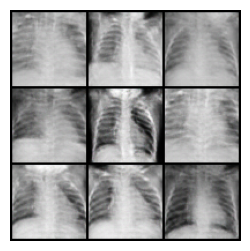

Epoch: 93/100 Batches: 0/41	Loss_D: 0.2141   Loss_G: 6.6574    D(x): 0.9788    D(G(z)): 0.1628 / 0.0023


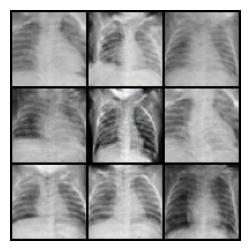

Epoch: 94/100 Batches: 0/41	Loss_D: 0.2710   Loss_G: 7.2580    D(x): 0.9598    D(G(z)): 0.1797 / 0.0019


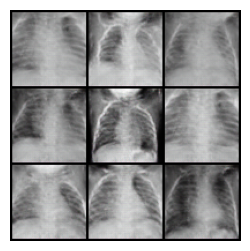

Epoch: 95/100 Batches: 0/41	Loss_D: 0.2898   Loss_G: 6.8317    D(x): 0.9431    D(G(z)): 0.1273 / 0.0032


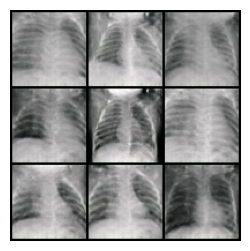

Epoch: 96/100 Batches: 0/41	Loss_D: 0.1720   Loss_G: 5.1624    D(x): 0.8935    D(G(z)): 0.0372 / 0.0109


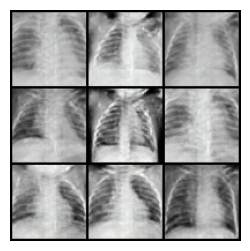

Epoch: 97/100 Batches: 0/41	Loss_D: 0.2015   Loss_G: 5.6081    D(x): 0.9307    D(G(z)): 0.0948 / 0.0063


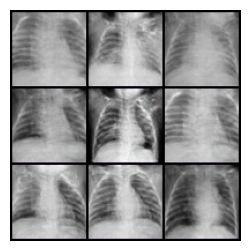

Epoch: 98/100 Batches: 0/41	Loss_D: 0.1429   Loss_G: 4.7450    D(x): 0.9457    D(G(z)): 0.0729 / 0.0176


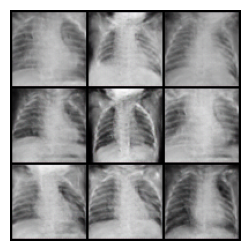

Epoch: 99/100 Batches: 0/41	Loss_D: 0.1590   Loss_G: 4.4406    D(x): 0.9098    D(G(z)): 0.0486 / 0.0185


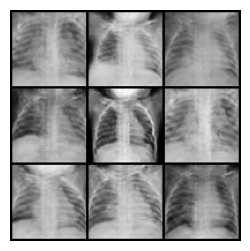

In [87]:
# Training Loop
data_len = len(dataloader)

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []


# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader (depends on batch_size and your number of images)
    for i, data in enumerate(dataloader, 0):
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        ############################
        # (3) Metrics & Evaluation
        ###########################
        
        # Print output training stats every 50 batches (if your dataset is large, printing at every epoch might be less frequent than you want)
        if i % 50 == 0:
            print(f"Epoch: {epoch}/{num_epochs} Batches: {i}/{data_len}\tLoss_D: {errD.item():.4f}   Loss_G: {errG.item():.4f}    D(x): {D_x:.4f}    D(G(z)): {D_G_z1:.4f} / {D_G_z2:.4f}")
            
        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
            
    # Generate fake images to see how the generator is doing by saving G's output on fixed_noise at each epoch (fixed noise allow to obtain similar images).
    if show_images == True:
        with torch.no_grad():
            # Uncomment the line below to generate a new variety of images every time
            #fixed_noise = torch.randn(64, nz, 1, 1, device=device)
            
            fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake[:nb_images], padding=2, normalize=True, nrow=nb_row))

            plt.figure(figsize=(3, 3))
            plt.axis("off")
            plt.imshow(np.transpose(img_list[-1], (1, 2, 0)))
            
            if save_images == True:
                plt.savefig(f'images/epoch_{epoch}_gen_images.png')
                
            # Display image  
            plt.show()
    
    # Save models each 5 epochs
    if epoch % 5 == 0:
        if save_model:
            save_dcgan(netG, netD, path_checkpoint=f"models/chest_epoch_{epoch}_checkpoint.pkl")
        
# Save the final models
save_dcgan(netG, netD, path_checkpoint="models/chest_final_epoch_checkpoint.pkl")

#### Plot losses

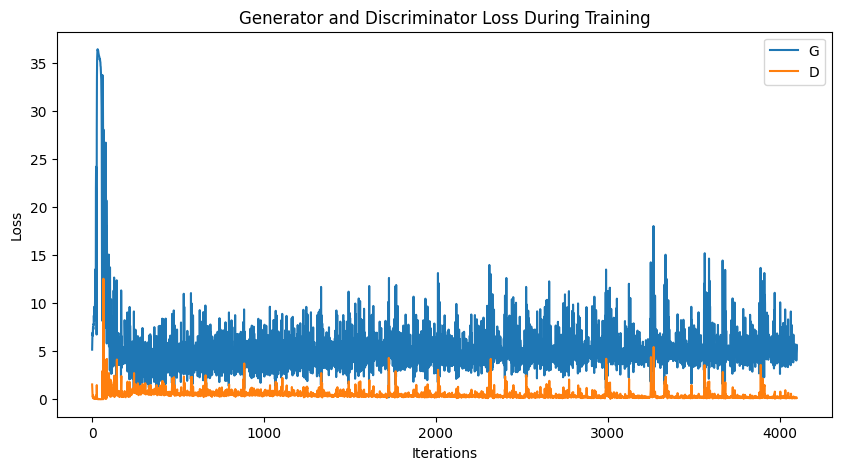

In [88]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

#### Follow the training epoch-by-epoch

In [89]:
# increase the default limit set by Matplotlib for embedding animations
import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 100  # 100 MB 

In [ ]:
fig = plt.figure(figsize=(8, 8))
plt.axis("off")
plt.tight_layout(pad=2.0, h_pad=2.0, w_pad=2.0)

# Initial empty title and image
title = plt.title("")  
img_plot = plt.imshow(np.transpose(img_list[0], (1, 2, 0)), animated=True)

def update_title_and_image(frame):
    img_plot.set_array(np.transpose(img_list[frame], (1, 2, 0)))
    title.set_text(f"Epoch {frame}/{num_epochs}")

ani = animation.FuncAnimation(fig, update_title_and_image, frames=len(img_list), interval=100, repeat_delay=5000)

# Display animation
HTML(ani.to_jshtml())

In [99]:
# Save the animation as a GIF
ani.save('images/dcgan_training_animation.gif', writer='pillow')

### Step 6 - Inference

You can now instantiate a new generator from the saved weights and use it to generate new images by feeding random noise into it:

In [92]:
# Specify desired weights path
path_checkpoint = "models/chest_final_epoch_checkpoint.pkl"

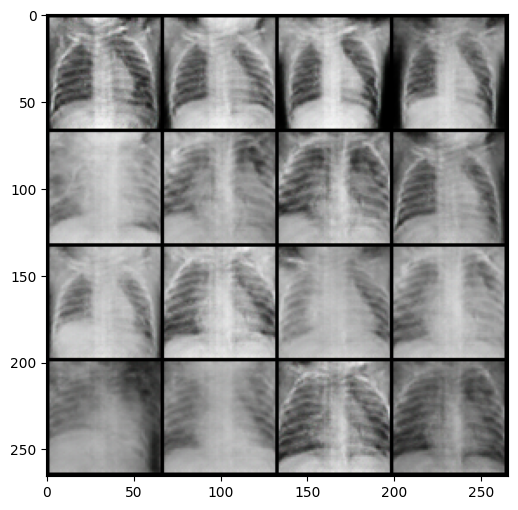

In [93]:
# Number of desired images
num_img = 16
nb_row = math.ceil(math.sqrt(num_img))

# Create a random noise
random_noise = torch.randn(num_img, nz, 1, 1, device=device)

# Instantiate a generator
new_gen= Generator(nb_gpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (nb_gpu > 1):
    new_gen = nn.DataParallel(new_gen, list(range(nb_gpu)))

# Load weights from path
checkpoint = torch.load(path_checkpoint, map_location="cpu")
state_dict_g = checkpoint["g_model_state_dict"]
new_gen.load_state_dict(state_dict_g)

# Generate images
with torch.no_grad():
    fake_data = new_gen(random_noise).detach().cpu()

# Plot images
img_grid = vutils.make_grid(fake_data, padding=2, normalize=True, nrow=nb_row).cpu()
img_grid = np.transpose(img_grid, (1, 2, 0))
plt.figure(figsize=(6, 6))
plt.imshow(img_grid)
plt.show()

#### Post-processing

However, the evaluation of the generated images is equally important to assess the quality of the generated samples. 

To do this, we can instantiate a discriminator from our saved weights. Then, we will pass the generated images through the discriminator, which will give us the real/fake probabilities. We will determine a $threshold$ which will be used to keep only images with a $probability > threshold$.

In [94]:
# Instantiate a discriminator
new_dis= Discriminator(nb_gpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (nb_gpu > 1):
    new_dis = nn.DataParallel(new_dis, list(range(nb_gpu)))

# Load weights from path
checkpoint = torch.load(path_checkpoint, map_location="cpu")
state_dict_d = checkpoint["d_model_state_dict"]
new_dis.load_state_dict(state_dict_d)

<All keys matched successfully>

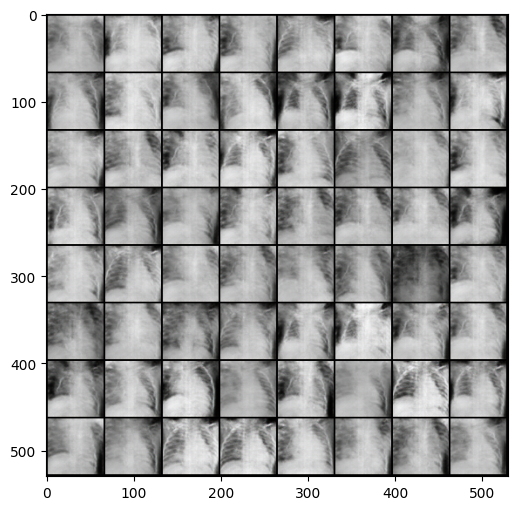

In [108]:
# Set threshold
threshold = 0.70

# Create list to store the images classified as >= threshold
verified_images = []

# Till we do not have 64 images

while len(verified_images)<64:
    # Create a random noise
    random_noise = torch.randn(num_img, nz, 1, 1, device=device)
    # Generate images for this noise
    with torch.no_grad():
        fake_data = new_gen(random_noise)

        # Set the discriminator to eval mode
        new_dis.eval()

        # Pass the generated fake_data through the discriminator & obtain real/fake probabilities
        output_probabilities = new_dis(fake_data)
        
    # Create mask (If prob < threshold, set to False, else True)
    good_image_mask = output_probabilities >= threshold
    
    # Remove extra tensor dims (torch.Size([16, 1, 1, 1]) -> torch.Size([16]))
    good_image_mask = good_image_mask.squeeze() 
    
    # Keep the selected images
    good_images = fake_data[good_image_mask > threshold]
    
    # If good_images is not None
    if good_images.numel() > 0:
        # Loop through the tensor along the first dimension (index 0), since we have x images in a torch.Size([x, 3, 64, 64]) object
        for i in range(good_images.size(0)):
            # Add selected images
            verified_images.append(good_images[i])

# Plot selected images
img_grid = vutils.make_grid(verified_images, padding=2, normalize=True, nrow=8).cpu()
img_grid = np.transpose(img_grid, (1, 2, 0))
plt.figure(figsize=(6, 6)) 
plt.imshow(img_grid)
plt.show()

#### Curated images

By running the code multiple times, you can selectively retain indexes of images that appear more realistic than others. Subsequently, these curated images can be utilized to generate a new grid, showcasing the most convincing and high-quality results produced by the model.

In [101]:
# filtered_images =[]

In [109]:
index_to_keep=[13]

for i in index_to_keep:
    filtered_images.append(verified_images[i])
    
print(f'Number of curated images {len(filtered_images)}')

Number of curated images 9


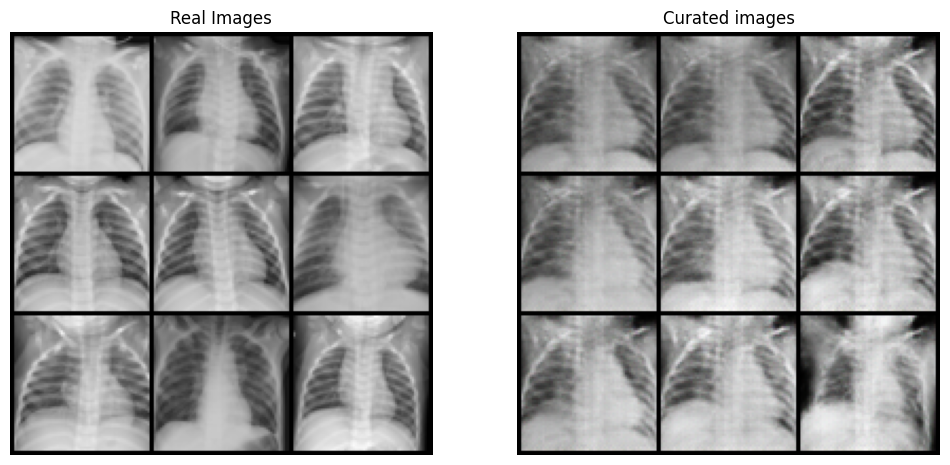

In [116]:
# Plot real training images and our curated images
nb_row = math.ceil(math.sqrt(len(filtered_images)))

# Real images
plt.figure(figsize=(12,12))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:len(filtered_images)], padding=2, normalize=True, nrow=nb_row).cpu(),(1,2,0)))

# Fake images
img_grid = vutils.make_grid(filtered_images, padding=2, normalize=True, nrow=nb_row).cpu()
img_grid = np.transpose(img_grid, (1, 2, 0))
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Curated images")
plt.imshow(img_grid)

plt.show()

### Conclusion

I hope you have enjoyed this tutorial!

You are now more comfortable with image generation and the concept of Generative Adversarial Networks! 

You can train your own network on your dataset and generate images of faces, objects and landscapes. Happy GANning! 🎨🚀

You can check our next tutorials about computer vision to learn how to:

- [Perform Brain tumor segmentation using U-Net](https://github.com/ovh/ai-training-examples/blob/main/notebooks/computer-vision/image-segmentation/tensorflow/brain-tumor-segmentation-unet/notebook_image_segmentation_unet.ipynb)
 
- [Use Transfer Learning with ResNet50 for image classification](https://github.com/ovh/ai-training-examples/blob/main/notebooks/computer-vision/image-classification/tensorflow/resnet50/notebook-resnet-transfer-learning-image-classification.ipynb)

- [Train YOLOv7 for American Sign Language recognition](https://github.com/ovh/ai-training-examples/blob/main/notebooks/computer-vision/object-detection/miniconda/yolov7/notebook_object_detection_yolov7_asl.ipynb)

Papers

- [Generative Adversarial Nets, Ian Goodfellow, 2014](https://arxiv.org/abs/1406.2661)

- [Unsupervised Representation Learning with Deep Convolutional Generative Adversarial Networks, Alec Radford et al., 2016](https://arxiv.org/abs/1511.06434)